<a href="https://colab.research.google.com/github/su-0924/food-or-drink/blob/main/drink_food.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import shutil
from glob import glob
from PIL import Image
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import cv2
import torch
from torch import nn, optim
from torchvision import datasets, transforms, models
from torchvision.models import VGG16_BN_Weights, EfficientNet_B1_Weights
from torch.utils.data import DataLoader, random_split, Subset
from tqdm.notebook import tqdm

In [2]:
# 0: drink, 1: food

# 作業ディレクトリ
base_dir = os.path.join('/content', 'drive', 'MyDrive', 'SIGNATE')
# データの読み込み
train_df = pd.read_csv(os.path.join(base_dir, 'train.csv'))
train_df

,image_name,label
0,0000.png,0
1,0001.png,1
2,0002.png,1
3,0003.png,1
4,0004.png,0
...,...,...
2171,2171.png,1
2172,2172.png,1
2173,2173.png,1
2174,2174.png,0


In [3]:
# 訓練データのディレクトリを指定
train_dir = os.path.join(base_dir, 'train')
# テストデータのディレクトリを指定
test_dir = os.path.join(base_dir, 'test')
# 新規ディレクトリの作成
drink_dir = os.path.join(train_dir, 'drink')
food_dir = os.path.join(train_dir, 'food')

In [ ]:
# ----- trainフォルダをラベルごとに分ける（`datasets.ImageFolder`で扱えるようにするため） ----- #
# drinkフォルダが存在しなければ作成
if not os.path.exists(drink_dir):
  os.makedirs(drink_dir)
# foodフォルダが存在しなければ作成
if not os.path.exists(food_dir):
  os.makedirs(food_dir)
# 画像データの振り分け
for _, data in train_df.iterrows():
  if data['label'] == 0:
    shutil.move(os.path.join(train_dir, data['image_name']), drink_dir)
  else:
    shutil.move(os.path.join(train_dir, data['image_name']), food_dir)

# ----- testフォルダをラベルごとに分ける（`datasets.ImageFolder`で扱えるようにするため） ----- #
# 新規ディレクトリの作成
dummy_dir = os.path.join(test_dir, 'dummy_class')
# dummy_classフォルダが存在しなければ作成
if not os.path.exists(dummy_dir):
  os.makedirs(dummy_dir)
# testデータのpathを取得
test_image_paths = glob(test_dir + '/*.png')
for test_image_path in test_image_paths:
  # 画像データの移動
  shutil.move(test_image_path, dummy_dir)

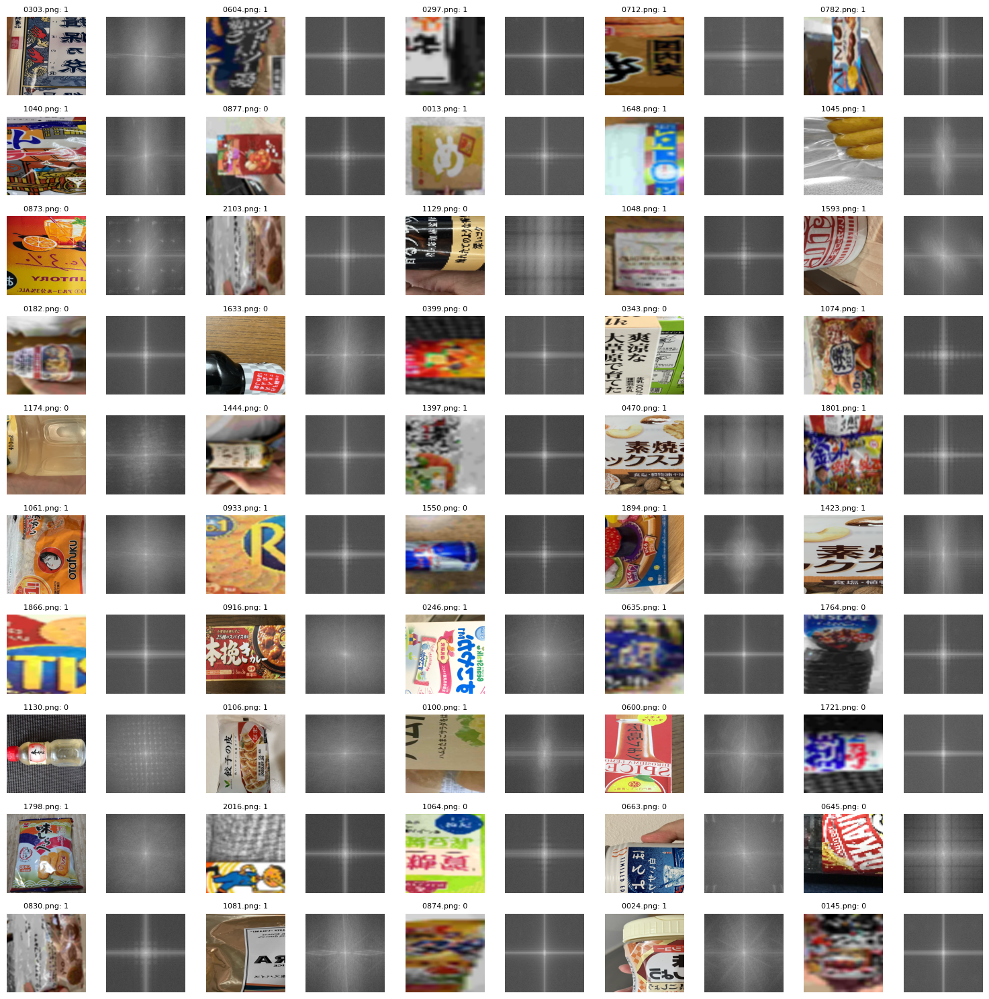

In [ ]:
# drinkとfoodのpathを取得
drink_file_paths = glob(os.path.join(drink_dir, '*.png'))
food_file_paths = glob(os.path.join(food_dir, '*.png'))
# drinkとfoodのpathを合算
train_file_paths = drink_file_paths + food_file_paths
# ランダムにtrain_file_pathsを取得
choice_train_file_paths = random.sample(train_file_paths, 50)

def plot_images(choice_train_file_paths):
  # 画像出力
  plt.figure(figsize=(15, 15))
  for i, image_path in enumerate(choice_train_file_paths):
    # ファイルの読み込み
    gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    color_image = cv2.imread(image_path)
    # BGR -> RGB に変換
    color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
    # 2Dフーリエ変換
    f = np.fft.fft2(gray_image)
    fshift = np.fft.fftshift(f)
    # パワースペクトルの計算
    magnitude_spectrum = np.log(np.abs(fshift))
    # ラベルの取得
    image_name = image_path.split('/')[-1]
    label = train_df[train_df['image_name'] == image_name]['label'].values[0]

    # カラー画像の表示
    ax = plt.subplot(10, 10, i*2+1)
    ax.set_title(f'{image_name}: {label}', fontsize=8)
    ax.imshow(color_image)
    ax.axis('off')

    # 周波数領域の分析結果
    ax = plt.subplot(10, 10, i*2+2)
    ax.imshow(magnitude_spectrum, cmap='gray')  # グレースケールで表示
    ax.axis('off')

  plt.tight_layout()
  plt.show()

plot_images(choice_train_file_paths)

In [ ]:
# 異常値と画像サイズの確認
for i, image_path in enumerate(train_file_paths):
  # 画像の読み込み
  image = cv2.imread(image_path)
  # 画像サイズの取得
  image_shape = image.shape
  # 異常時判定
  if (0 > image.min()) or (image.max() > 255):
    print(f'異常値のpath: {image_path}')
  if image_shape != (512, 512, 3):
    print(f'指定した画像サイズ以外のpath: {image_path}')

交差検証を用いて実装

In [4]:
# デバイスの割り当て
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [10]:
## 使用する関数の定義 ##

# ------------------------------------------------------------- PyTorch乱数固定 ------------------------------------------------------------- #
def torch_seed(seed=0):

  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.backends.cudnn.deterministic = True
  torch.use_deterministic_algorithms = True

# ----------------------------------------------------------------------- モデルの学習 ----------------------------------------------------------------------- #
def fit(net, criterion, optimizer, num_epochs, train_loader, val_loader, device, history, base_dir, fold, thresholds=0.5):

  base_epochs = len(history)
  best_val_auc = 0
  best_val_loss = float('inf')
  patience = 3
  no_improve = 0

  for epoch in range(base_epochs, num_epochs+base_epochs):
    # 1エポックあたりのデータ累積件数
    n_train, n_val = 0, 0
    # 1エポックあたりの累積損失（平均化前）
    train_loss, val_loss = 0, 0
    # 1エポックあたりの予測確率と真のラベル（1エポック終了ごとに初期化）
    y_true_train, y_pred_train = [], []
    y_true_val, y_pred_val = [], []
    # 検証データのファイルパスを取得
    file_paths_list = []

    # 訓練フェーズ
    net.train()
    for inputs, labels, _ in tqdm(train_loader):
      # 1バッチあたりのデータ件数
      train_batch_size = len(labels)
      # 1エポックあたりのデータ累積件数
      n_train += train_batch_size
      # GPUへ転送
      inputs = inputs.to(device)
      labels = labels.to(device)
      # 勾配の初期化
      optimizer.zero_grad()
      # 予測計算
      outputs = net(inputs)
      # 損失計算
      loss = criterion(outputs, labels)
      # 勾配計算
      loss.backward()
      # パラメータ修正
      optimizer.step()
      # 予測確率算出
      probs = nn.functional.softmax(outputs, dim=1)[:, 1].cpu().detach().numpy()
      # 損失と精度の計算
      train_loss += loss.item() * train_batch_size
      y_true_train.extend(labels.cpu().numpy())
      y_pred_train.extend(probs)

    # 予測フェーズ
    net.eval()
    with torch.no_grad():
      for i, (inputs_val, labels_val, paths) in enumerate(val_loader):
        # 1バッチあたりのデータ件数
        val_batch_size = len(labels_val)
        # 1エポックあたりのデータ累積件数
        n_val += val_batch_size
        # GPUへ転送
        inputs_val = inputs_val.to(device)
        labels_val = labels_val.to(device)
        # 予測計算
        outputs_val = net(inputs_val)
        # 損失計算
        loss_test = criterion(outputs_val, labels_val)
        # 予測確率算出
        probs_val = nn.functional.softmax(outputs_val, dim=1)[:, 1].cpu().numpy()
        # 損失と精度の計算
        val_loss += loss_test.item() * val_batch_size
        y_true_val.extend(labels_val.cpu().numpy())
        y_pred_val.extend(probs_val)
        file_paths_list.extend(paths)

    # 精度計算
    train_fpr, train_tpr, _ = roc_curve(y_true_train, y_pred_train)
    val_fpr, val_tpr, _ = roc_curve(y_true_val, y_pred_val)
    train_auc = auc(train_fpr, train_tpr)
    val_auc = auc(val_fpr, val_tpr)
    # 損失計算
    avg_train_loss = train_loss / n_train
    avg_val_loss = val_loss / n_val

    # aucが最も高いものに更新
    if best_val_auc < val_auc:
      best_val_auc = val_auc
      # best_val_aucで使用したfpr, tpr, probs_valを保存
      best_train_fpr = train_fpr
      best_train_tpr = train_tpr
      best_val_fpr = val_fpr
      best_val_tpr = val_tpr
      best_true_val = np.array(y_true_val)
      best_pred_val = np.array(y_pred_val)
      # probs_valがthresholdsより大きければ1、小さければ0にラベル付け
      predicted_labels = (best_pred_val > thresholds).astype('int')
      cm = confusion_matrix(best_true_val, predicted_labels)
      # result_dfにcolumnsで指定した結果を格納
      columns = ['file_path', 'y_true_val', 'y_pred_val', 'predicted_labels']
      result_df = pd.DataFrame(columns=columns, index=range(len(y_pred_val)))
      result_df['file_path'] = file_paths_list
      result_df['y_true_val'] = y_true_val
      result_df['y_pred_val'] = y_pred_val
      result_df['predicted_labels'] = predicted_labels
      # ベストパラメータを保存
      torch.save(net.state_dict(), os.path.join(base_dir, f'best_model{fold+1}.pth'))
      # 改善があったのでカウンターをリセット
      no_improve = 0
    else:
      # 改善がなかったのでカウンターを+1
      no_improve += 1
      if no_improve >= patience:
        # patience回改善がなかったので訓練を停止
        print("Early stopping")
        break

    # 結果表示
    print(f'Epoch [{(epoch+1)}/{num_epochs+base_epochs}], loss: {avg_train_loss:.5f} auc: {train_auc:.5f} val_loss: {avg_val_loss:.5f}, val_auc: {val_auc:.5f}')
    # 記録
    item = np.array([epoch+1, avg_train_loss, train_auc, avg_val_loss, val_auc])
    history = np.vstack([history, item])
  return history, result_df, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm

# ------------------------------------------------------------- モデルの予測 ------------------------------------------------------------- #
def predict(test_loader, device, base_dir):

  # 各foldで学習したモデルの数
  num_models = 5
  models = []

  for i in range(num_models):
    # 最適なモデルのパラメータをロード
    save_path = os.path.join(base_dir, f'best_model{i+1}.pth')
    # パラメータを更新
    net = create_new_network()
    net.load_state_dict(torch.load(save_path))
    net.eval()
    models.append(net)

  final_predictions = []

  for inputs_test, _ in test_loader:
    # GPUへ転送
    inputs_test = inputs_test.to(device)
    # 各モデルの予測を保存するリスト
    model_prob_predictions = []

    for model in models:
      with torch.no_grad():
        # 予測計算
        outputs_test = model(inputs_test)
        # 予測確率算出（ラベル１の確率を取得）
        probs_test = nn.functional.softmax(outputs_test, dim=1)[:, 1]
        # 各モデルの予測確率を格納
        model_prob_predictions.append(probs_test.cpu().numpy())
    # Numpy配列に変換
    model_prob_predictions = np.array(model_prob_predictions)

    # 各サンプルについて平均陽性確率を計算
    mean_prob = np.mean(model_prob_predictions, axis=0)
    # 上記で求めた平均陽性確率を格納
    final_predictions.extend(mean_prob)

  return np.array(final_predictions)

# ------------------------------------------------------------- 画像出力 ------------------------------------------------------------- #
def show_images_labels(val_loader, result_df):

  # result_dfからランダムに100個のサンプルを取得
  sample_df = result_df.sample(n=100).reset_index(drop=True)
  plt.figure(figsize=(10, 10))
  for i, row in sample_df.iterrows():
    ax = plt.subplot(10, 10, i+1)
    # ファイルの読み込み
    image = cv2.imread(row['file_path'])
    # BGR -> RGB に変換
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # 予測が一致しているものはフォントを黒、一致しないものはフォントを青
    if row['y_true_val'] == row['predicted_labels']:
      c = 'k'
    else:
      c = 'b'
    ax.set_title(f"{row['file_path'].split('/')[-1]} -> {row['y_true_val']}: {row['y_pred_val']:.3f}", c=c, fontsize=6)
    ax.imshow(image)
    ax.axis('off')
  plt.tight_layout()
  plt.show()

# ------------------------------------------------------------- モデルの定義 ------------------------------------------------------------- #
def create_new_network():

  # EfficientNetを学習済みパラメータ付きで読み込む
  # net = models.vgg16_bn(weights=VGG16_BN_Weights.IMAGENET1K_V1)
  net = models.efficientnet_b1(weights=EfficientNet_B1_Weights.IMAGENET1K_V1)
  # 最終ノードの出力を更新
  # net.classifier[-1] = nn.Linear(4096, 10)
  net.classifier[-1] = nn.Linear(1280, 10)
  # GPUの利用
  net = net.to(device)
  return net

# ------------------------------------------------------------- 最適化関数の定義 ------------------------------------------------------------- #
def create_new_optimizer(model):

  # 学習率
  lr = 1e-4
  # 損失関数に交差エントロピーを利用
  criterion = nn.CrossEntropyLoss()
  # 最適化関数（weight_decay: L2正則化）
  optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)
  return criterion, optimizer

# ------------------------------------------------------------- 学習曲線 ------------------------------------------------------------- #
def learning_curve_and_confusion_matrix(history, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm):

  # 混同行列
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['0:drink', '1:food'])
  disp.plot()
  # 学習曲線
  fig, ax = plt.subplots(1, 3, figsize=(15, 5))
  # epochs vs loss
  ax[0].plot(history[:, 0], history[:, 1], label='train_data')
  ax[0].plot(history[:, 0], history[:, 3], label='val_data')
  ax[0].set_title('epochs vs loss')
  ax[0].set_xlabel('epochs')
  ax[0].set_ylabel('loss')
  ax[0].legend()
  # epochs vs auc
  ax[1].plot(history[:, 0], history[:, 2], label='train_data')
  ax[1].plot(history[:, 0], history[:, 4], label='val_data')
  ax[1].set_title('epochs vs auc')
  ax[1].set_xlabel('epochs')
  ax[1].set_ylabel('auc')
  ax[1].legend()
  # roc_curve
  ax[2].plot(best_train_fpr, best_train_tpr, label='train_data')
  ax[2].plot(best_val_fpr, best_val_tpr, label='val_data')
  ax[2].set_title('roc_curve')
  ax[2].set_xlabel('1-specificity(FPR)')
  ax[2].set_ylabel('sensitivity(TPR)')
  ax[2].legend()
  plt.tight_layout()
  plt.show()

In [6]:
## Transforms定義 ##

# 訓練データ用：正規化に追加で反転とRandomErasingを実施
train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0)
])
# 検証データ用：正規化のみ実施
test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

EfficientNet

========================== 1fold ==========================


Downloading: "https://download.pytorch.org/models/efficientnet_b1_rwightman-bac287d4.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1_rwightman-bac287d4.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 123MB/s]


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.60812 auc: 0.53640 val_loss: 1.15534, val_auc: 0.61953


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.81445 auc: 0.71809 val_loss: 0.82193, val_auc: 0.74916


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.59703 auc: 0.83051 val_loss: 0.66232, val_auc: 0.81053


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.47412 auc: 0.89449 val_loss: 0.56420, val_auc: 0.84381


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.35270 auc: 0.94694 val_loss: 0.50099, val_auc: 0.87071


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.24706 auc: 0.97595 val_loss: 0.46437, val_auc: 0.88865


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.18103 auc: 0.98683 val_loss: 0.48621, val_auc: 0.89422


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.12743 auc: 0.99398 val_loss: 0.46079, val_auc: 0.90254


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.10141 auc: 0.99546 val_loss: 0.42715, val_auc: 0.91386


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.10064 auc: 0.99548 val_loss: 0.43608, val_auc: 0.91212


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.08859 auc: 0.99689 val_loss: 0.47468, val_auc: 0.90046


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


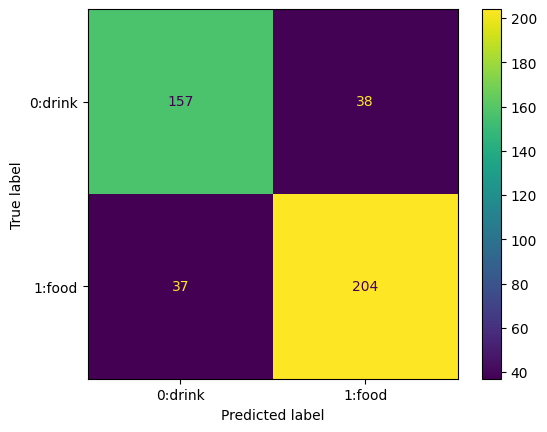

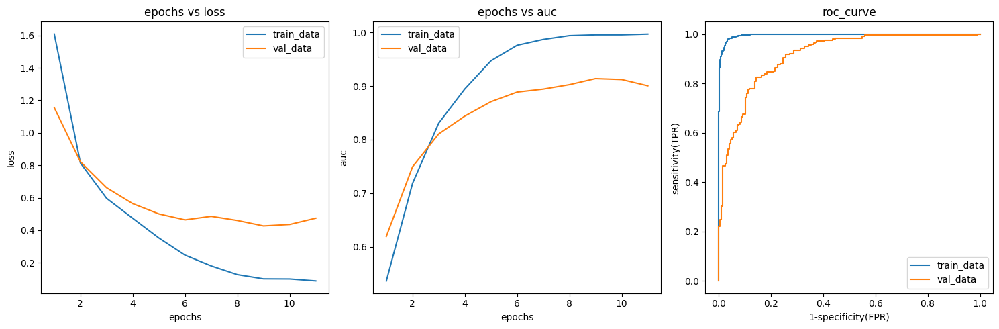

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


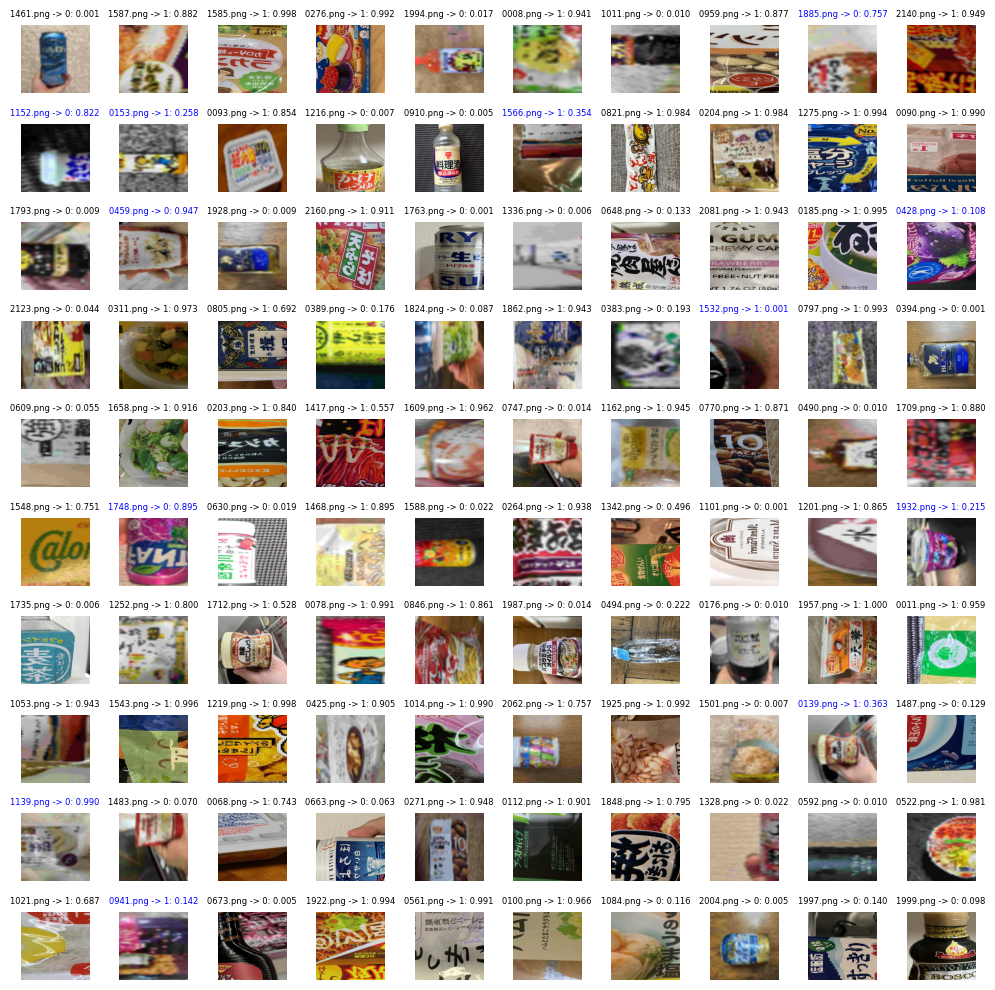

========================== 2fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.53960 auc: 0.51665 val_loss: 1.13422, val_auc: 0.59903


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.78287 auc: 0.73745 val_loss: 0.84239, val_auc: 0.71371


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.57784 auc: 0.83132 val_loss: 0.69853, val_auc: 0.78909


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.44192 auc: 0.90974 val_loss: 0.61307, val_auc: 0.81888


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.33176 auc: 0.95222 val_loss: 0.56119, val_auc: 0.85135


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22396 auc: 0.98271 val_loss: 0.52552, val_auc: 0.86534


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.15196 auc: 0.99251 val_loss: 0.52640, val_auc: 0.87065


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.15609 auc: 0.98777 val_loss: 0.52586, val_auc: 0.88118


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.09890 auc: 0.99599 val_loss: 0.50254, val_auc: 0.89294


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.08889 auc: 0.99715 val_loss: 0.53640, val_auc: 0.88523


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.06130 auc: 0.99892 val_loss: 0.54818, val_auc: 0.88054


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


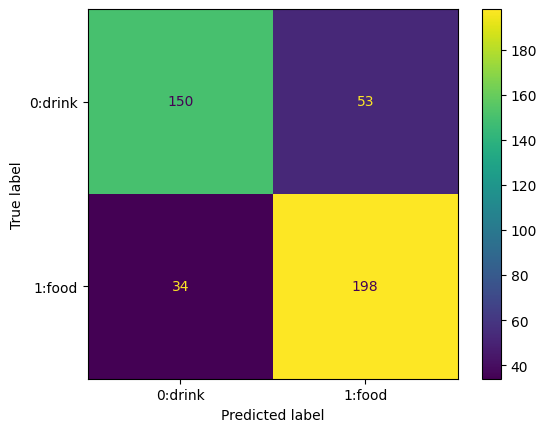

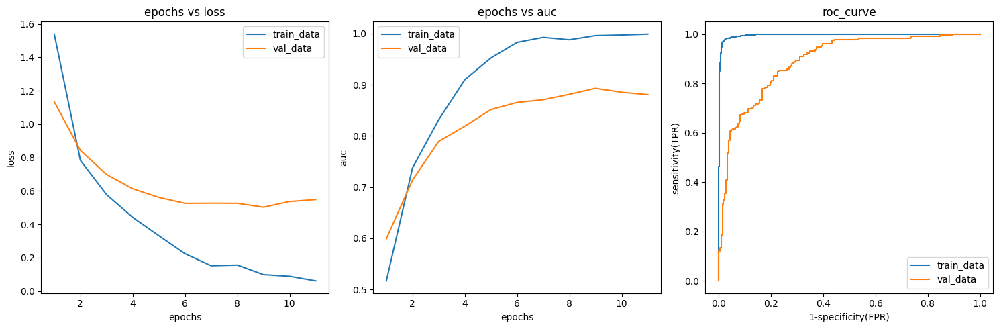

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


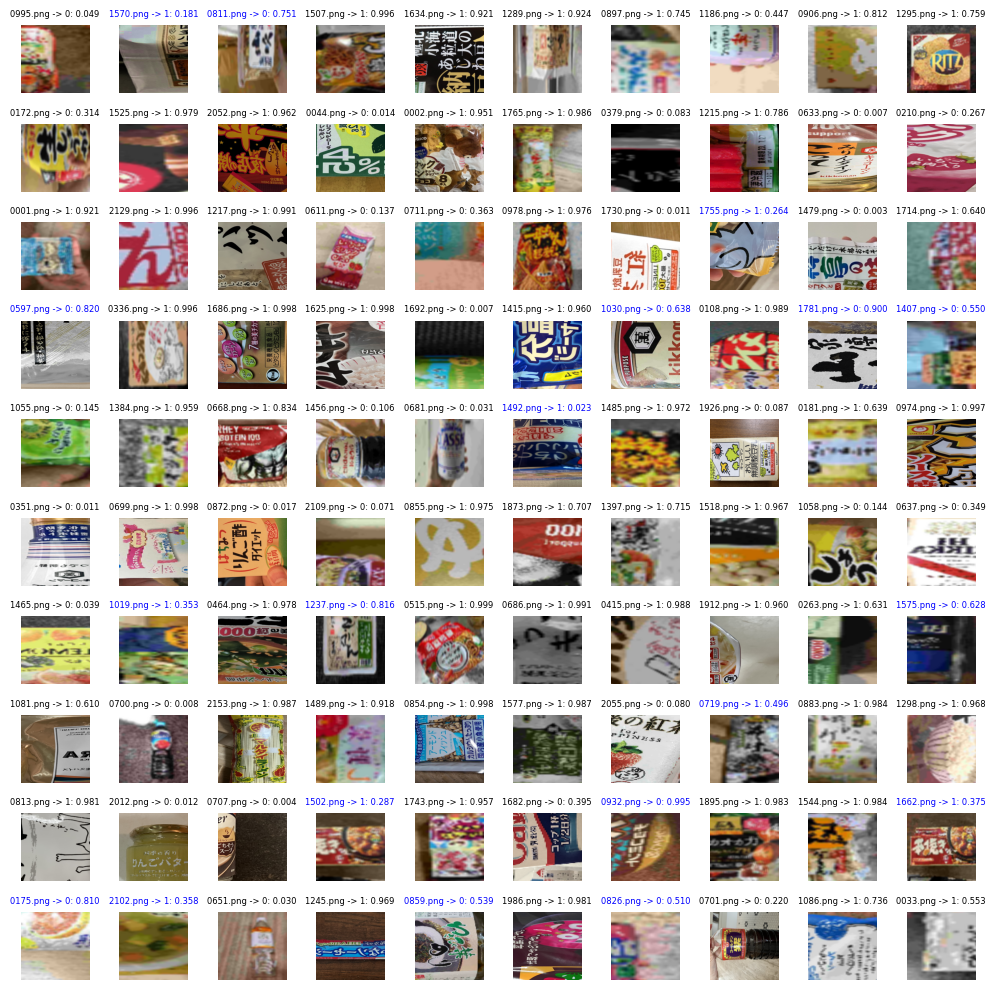

========================== 3fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.44335 auc: 0.53386 val_loss: 1.10543, val_auc: 0.62580


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.76951 auc: 0.74588 val_loss: 0.81908, val_auc: 0.73644


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.58013 auc: 0.84533 val_loss: 0.68601, val_auc: 0.79945


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.45414 auc: 0.90894 val_loss: 0.60068, val_auc: 0.83086


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.32729 auc: 0.95788 val_loss: 0.52948, val_auc: 0.86683


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22961 auc: 0.98222 val_loss: 0.53405, val_auc: 0.87081


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.15798 auc: 0.99279 val_loss: 0.45040, val_auc: 0.90100


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.11400 auc: 0.99568 val_loss: 0.49472, val_auc: 0.89051


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.09591 auc: 0.99683 val_loss: 0.47697, val_auc: 0.90001


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


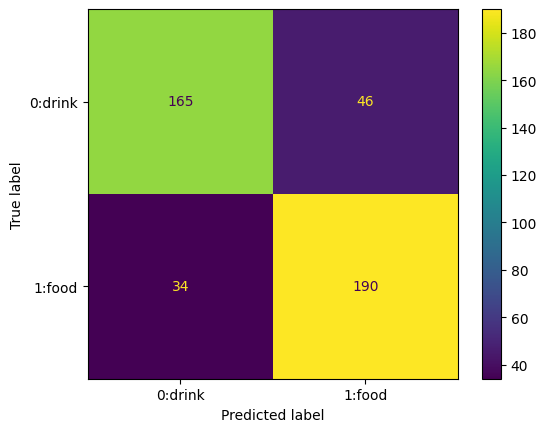

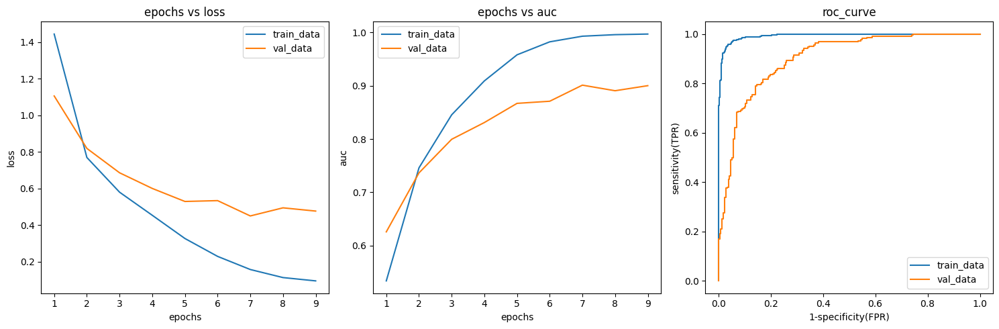

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


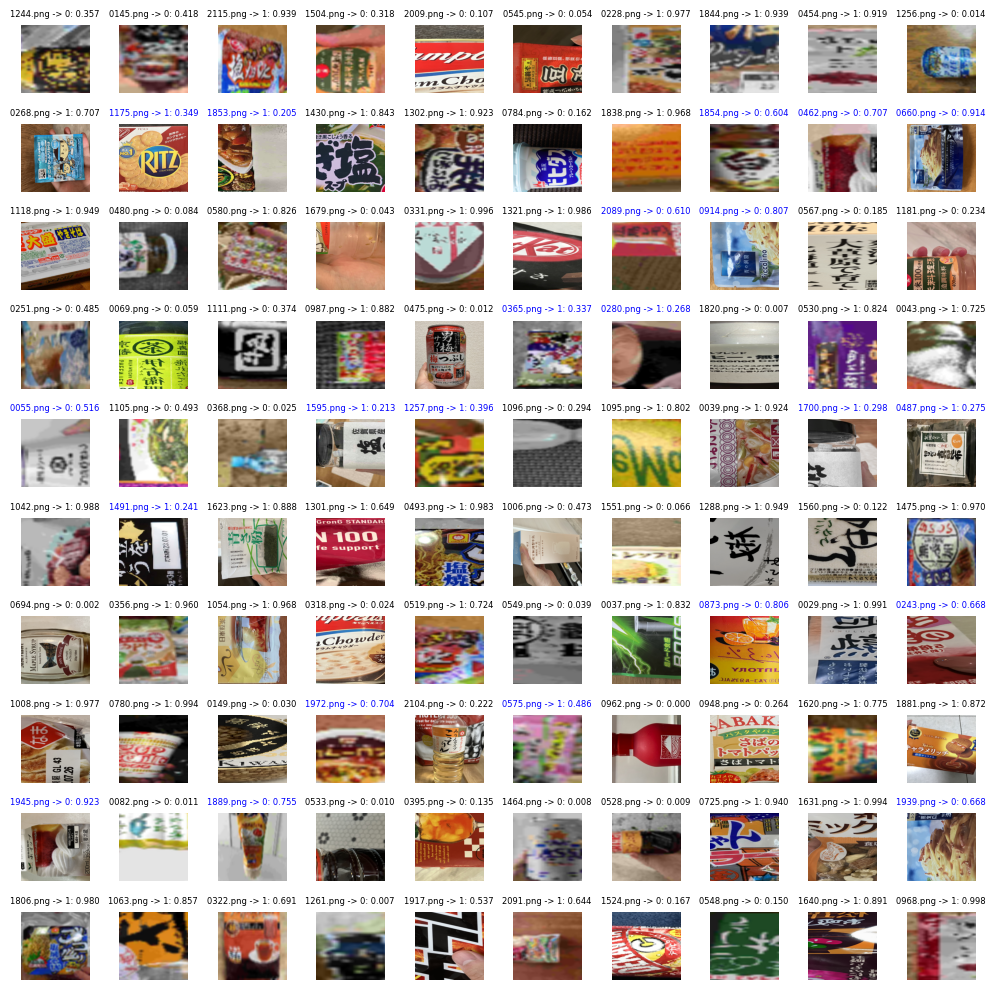

========================== 4fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.55626 auc: 0.53113 val_loss: 1.16441, val_auc: 0.55157


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.80265 auc: 0.72016 val_loss: 0.85456, val_auc: 0.70005


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.59688 auc: 0.82862 val_loss: 0.67927, val_auc: 0.76340


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.45777 auc: 0.90127 val_loss: 0.58642, val_auc: 0.82652


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.35064 auc: 0.94669 val_loss: 0.52408, val_auc: 0.85462


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.23862 auc: 0.97892 val_loss: 0.47288, val_auc: 0.87552


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.16773 auc: 0.98852 val_loss: 0.50052, val_auc: 0.86966


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.13712 auc: 0.99199 val_loss: 0.56005, val_auc: 0.85948


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


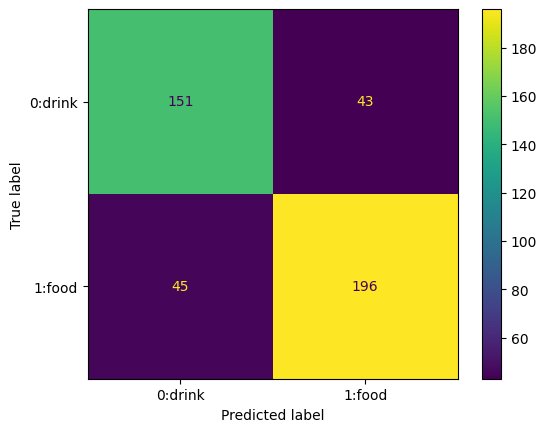

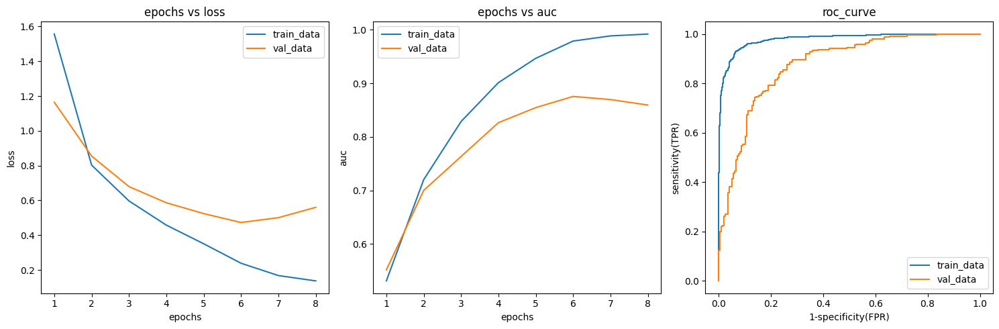

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


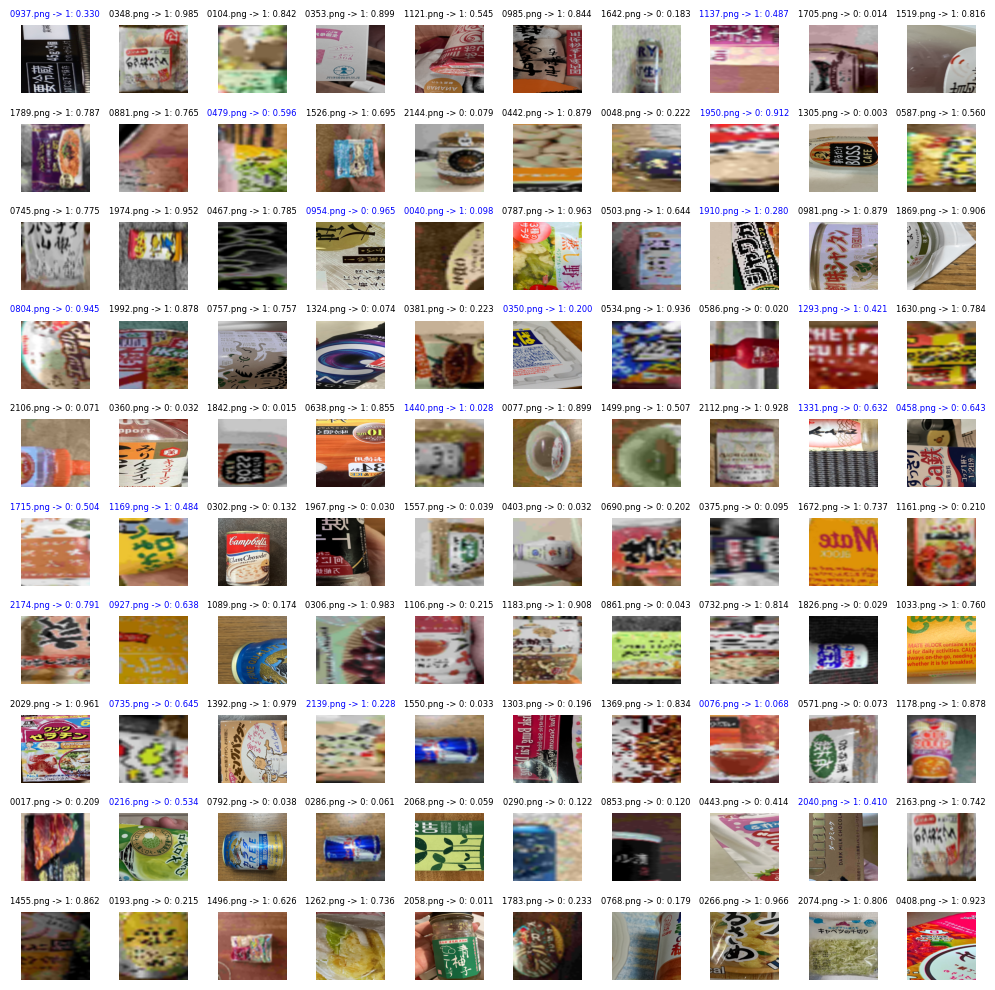

========================== 5fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.48828 auc: 0.52730 val_loss: 1.09712, val_auc: 0.64829


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.78471 auc: 0.72885 val_loss: 0.80492, val_auc: 0.76322


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.57669 auc: 0.83809 val_loss: 0.63817, val_auc: 0.81330


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.44976 auc: 0.91062 val_loss: 0.57998, val_auc: 0.83439


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.33978 auc: 0.94891 val_loss: 0.53724, val_auc: 0.85827


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22461 auc: 0.98287 val_loss: 0.50321, val_auc: 0.87010


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.14926 auc: 0.99295 val_loss: 0.55814, val_auc: 0.86284


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.11606 auc: 0.99496 val_loss: 0.52489, val_auc: 0.87827


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.10789 auc: 0.99462 val_loss: 0.53191, val_auc: 0.88308


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.09975 auc: 0.99525 val_loss: 0.53464, val_auc: 0.88007


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.07477 auc: 0.99769 val_loss: 0.55377, val_auc: 0.88784


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.07094 auc: 0.99817 val_loss: 0.51224, val_auc: 0.89900


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.06264 auc: 0.99791 val_loss: 0.61890, val_auc: 0.87935


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.10268 auc: 0.99447 val_loss: 0.51924, val_auc: 0.90108


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.07533 auc: 0.99756 val_loss: 0.55596, val_auc: 0.89559


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.07249 auc: 0.99676 val_loss: 0.51152, val_auc: 0.90477


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.06590 auc: 0.99766 val_loss: 0.49344, val_auc: 0.90692


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.06960 auc: 0.99760 val_loss: 0.64472, val_auc: 0.88100


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [19/100], loss: 0.07191 auc: 0.99665 val_loss: 0.48620, val_auc: 0.91557


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [20/100], loss: 0.06616 auc: 0.99711 val_loss: 0.54324, val_auc: 0.90898


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [21/100], loss: 0.06983 auc: 0.99737 val_loss: 0.51868, val_auc: 0.91694


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [22/100], loss: 0.06307 auc: 0.99804 val_loss: 0.50518, val_auc: 0.91614


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [23/100], loss: 0.06828 auc: 0.99730 val_loss: 0.50326, val_auc: 0.91915


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [24/100], loss: 0.05323 auc: 0.99837 val_loss: 0.50705, val_auc: 0.92237


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [25/100], loss: 0.08609 auc: 0.99593 val_loss: 0.54331, val_auc: 0.91172


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [26/100], loss: 0.11373 auc: 0.99276 val_loss: 0.40496, val_auc: 0.94110


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [27/100], loss: 0.07032 auc: 0.99698 val_loss: 0.42511, val_auc: 0.92921


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [28/100], loss: 0.05192 auc: 0.99822 val_loss: 0.44540, val_auc: 0.92679


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


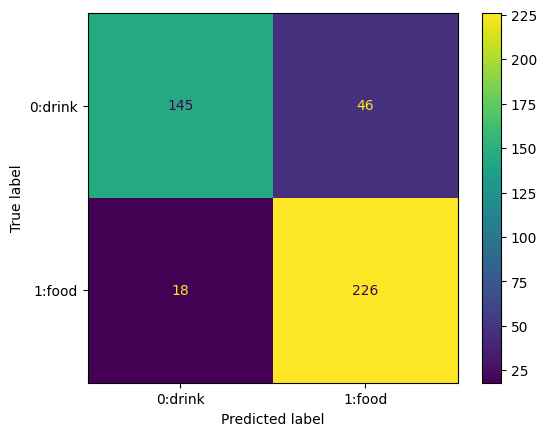

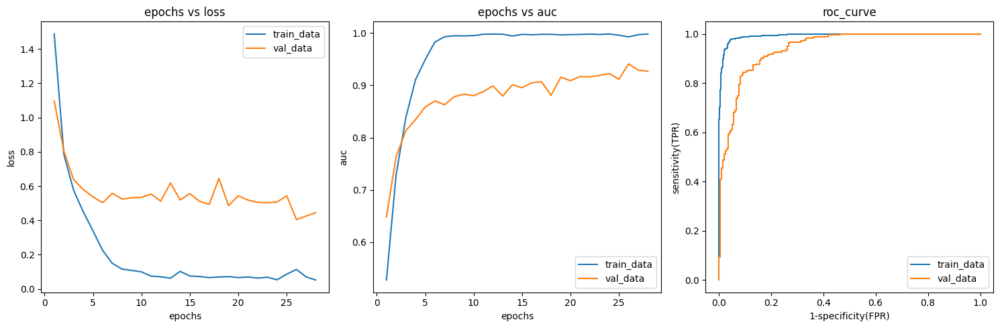

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


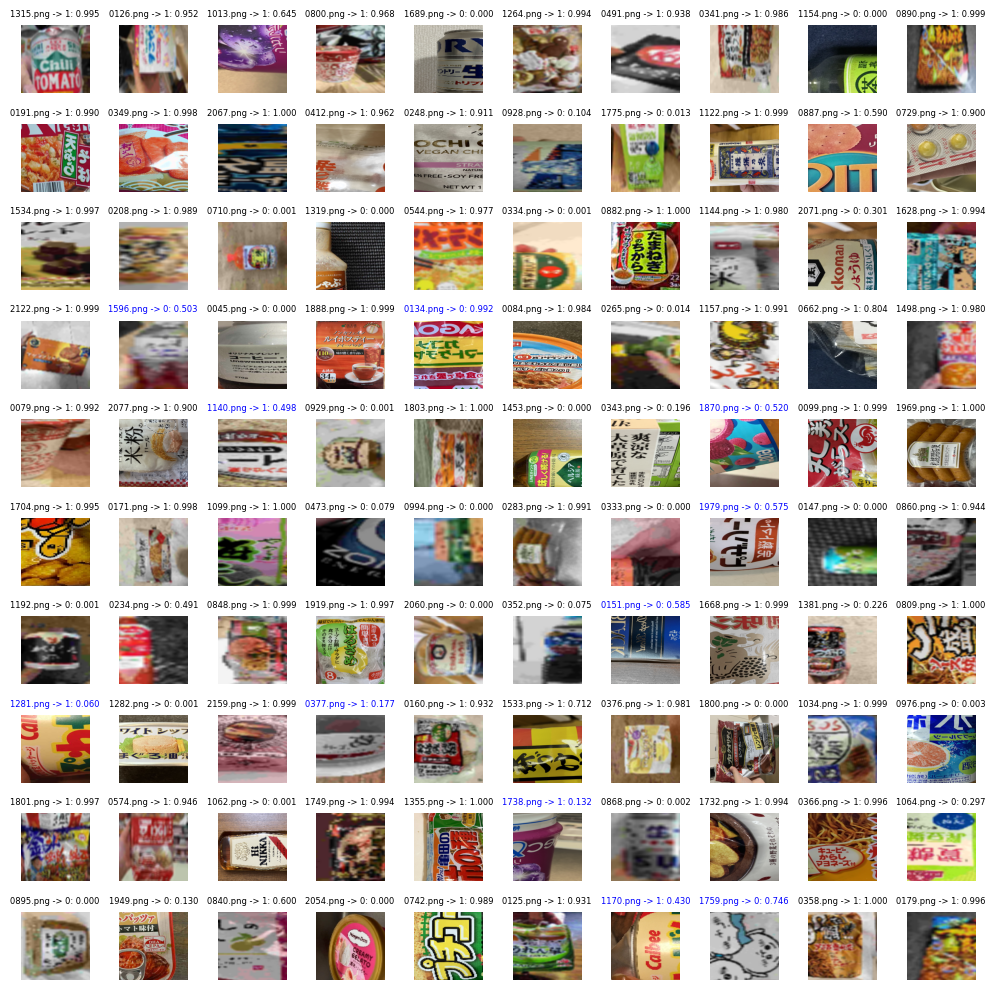

In [ ]:
# 乱数初期化
torch_seed()

# バッチサイズ
train_batch_size = 32
test_batch_size = 128

# エポック数
num_epochs = 100

# データローダーのためのカスタムデータセットクラス
class ImageFolderWithPaths(datasets.ImageFolder):

  # 指定されたインデックスのデータアイテムを返すメソッド
  def __getitem__(self, index):
    # 通常のImageFolderの出力(画像データとラベル)を取得
    original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
    # ファイルパスを取得
    path = self.imgs[index][0]
    # 元のタプルにパスを追加
    tuple_with_path = original_tuple + (path,)
    return tuple_with_path

# データセットをロード
train_dataset = ImageFolderWithPaths(train_dir, transform=train_transform)
val_dataset = ImageFolderWithPaths(train_dir, transform=test_transform)

# 5Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
for fold, (trn_idx, val_idx) in enumerate(cv.split(train_df['image_name'], train_df['label'])):

  print(f'========================== {fold+1}fold ==========================')
  # この中にログを保存
  history = np.zeros([0, 5])
  # 関数の呼び出し
  net = create_new_network()
  criterion, optimizer = create_new_optimizer(net)

  # インデックスに対応したデータのみ抽出
  train_data = Subset(train_dataset, trn_idx)
  val_data = Subset(val_dataset, val_idx)

  # データローダー定義（訓練用）
  train_loader = DataLoader(train_data, batch_size=train_batch_size, shuffle=True)
  # データローダー定義（検証用）
  val_loader = DataLoader(val_data, batch_size=test_batch_size, shuffle=False)
  # モデルの学習
  history, result_df, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm = fit(net, criterion, optimizer, num_epochs, train_loader, val_loader, device, history, base_dir, fold)
  # 学習曲線を描画
  learning_curve_and_confusion_matrix(history, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm)
  # 検証データの画像と予測結果の出力
  print('閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)')
  show_images_labels(val_loader, result_df)

In [ ]:
# バッチサイズ
test_batch_size = 128
# データセットをロード
test_data = datasets.ImageFolder(test_dir, transform=test_transform)
# データローダー
test_loader = DataLoader(test_data, batch_size=test_batch_size, shuffle=False)
# テストデータへの適用
test_pred_proba = predict(test_loader, device, base_dir)

In [ ]:
# submit
submit = pd.read_csv(os.path.join(base_dir, 'sample_submit.csv'), header=None)
submit[1] = test_pred_proba
submit.to_csv(os.path.join(base_dir, 'submit_0915.csv'), index=None, header=None)

In [ ]:
submit

,0,1
0,2176.png,0.820610
1,2177.png,0.949894
2,2178.png,0.078434
3,2179.png,0.999798
4,2180.png,0.000016
...,...,...
2175,4351.png,0.000301
2176,4352.png,0.000036
2177,4353.png,0.515025
2178,4354.png,0.047032


<Axes: xlabel='1', ylabel='Count'>

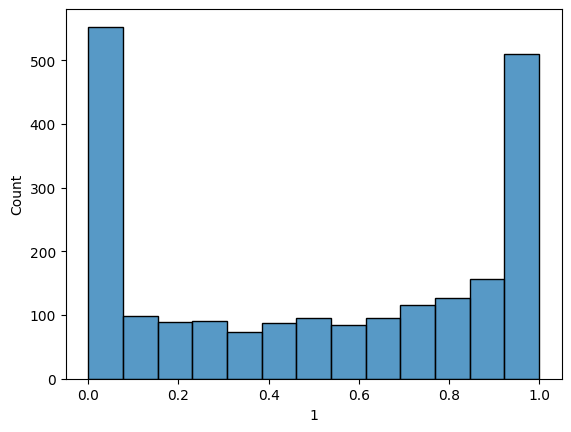

In [ ]:
sns.histplot(submit[1])

ベースライン（vgg16_bn）

========================== 1fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.08824 auc: 0.55379 val_loss: 0.60479, val_auc: 0.77487


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.62593 auc: 0.71433 val_loss: 0.54444, val_auc: 0.80768


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.54514 auc: 0.80253 val_loss: 0.51272, val_auc: 0.82675


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.43015 auc: 0.88986 val_loss: 0.49234, val_auc: 0.84060


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.31498 auc: 0.94820 val_loss: 0.47585, val_auc: 0.85867


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22578 auc: 0.97611 val_loss: 0.47800, val_auc: 0.87054


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.14081 auc: 0.99284 val_loss: 0.49247, val_auc: 0.87433


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.10510 auc: 0.99567 val_loss: 0.53321, val_auc: 0.87628


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.06297 auc: 0.99914 val_loss: 0.53127, val_auc: 0.88665


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.06031 auc: 0.99827 val_loss: 0.55309, val_auc: 0.88093


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.04052 auc: 0.99944 val_loss: 0.54840, val_auc: 0.88567


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


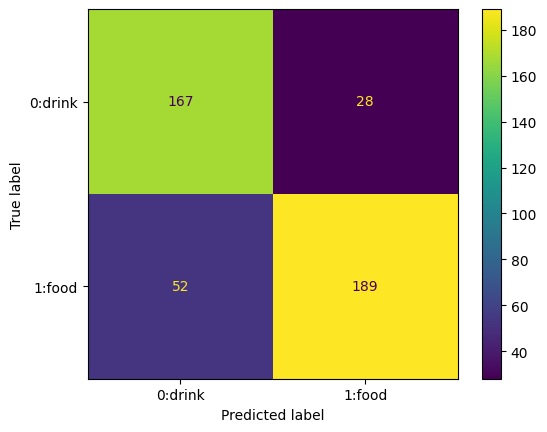

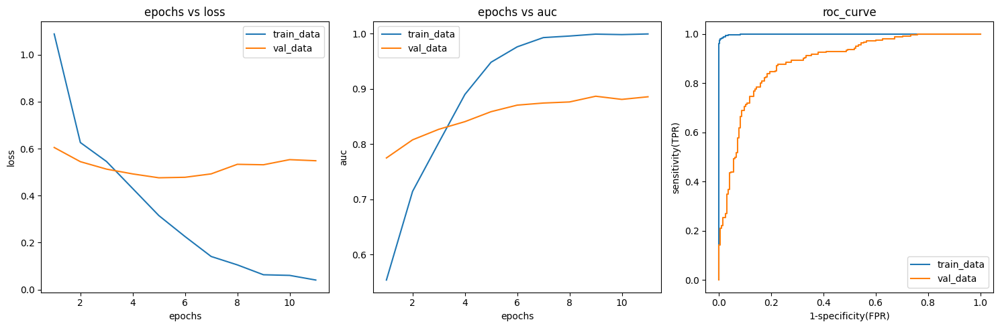

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


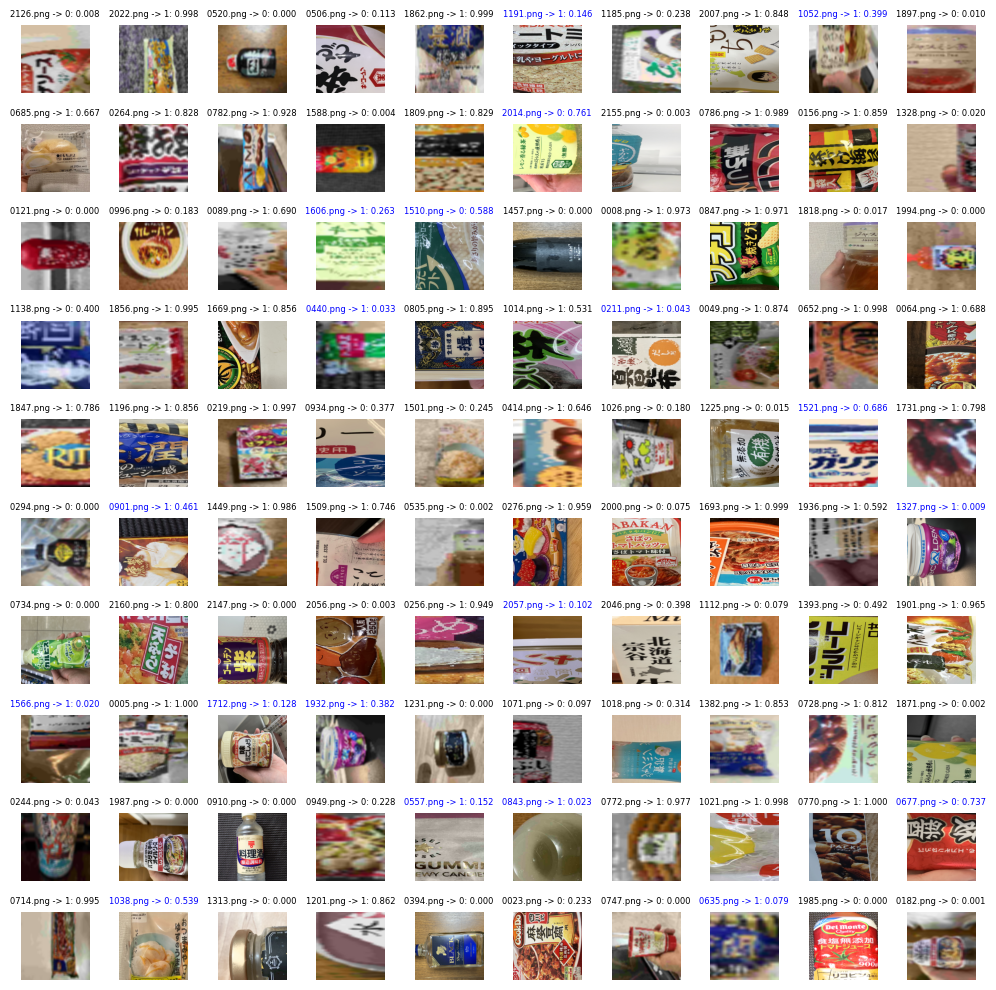

========================== 2fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.99542 auc: 0.56744 val_loss: 0.65231, val_auc: 0.68709


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.62497 auc: 0.71455 val_loss: 0.61460, val_auc: 0.73070


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.51343 auc: 0.82654 val_loss: 0.58446, val_auc: 0.75945


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.41978 auc: 0.89406 val_loss: 0.57733, val_auc: 0.77911


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.33934 auc: 0.93376 val_loss: 0.59077, val_auc: 0.80022


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.23088 auc: 0.97530 val_loss: 0.59374, val_auc: 0.81402


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.15717 auc: 0.98974 val_loss: 0.56319, val_auc: 0.83440


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.10693 auc: 0.99532 val_loss: 0.60462, val_auc: 0.83589


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.07967 auc: 0.99806 val_loss: 0.62650, val_auc: 0.83999


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.05604 auc: 0.99904 val_loss: 0.64617, val_auc: 0.84177


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.03982 auc: 0.99970 val_loss: 0.72268, val_auc: 0.83548


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.03771 auc: 0.99946 val_loss: 0.67924, val_auc: 0.84107


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.03919 auc: 0.99913 val_loss: 0.76324, val_auc: 0.84704


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.02839 auc: 0.99983 val_loss: 0.78854, val_auc: 0.84421


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.02061 auc: 0.99991 val_loss: 0.70810, val_auc: 0.85022


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.02392 auc: 0.99976 val_loss: 0.70778, val_auc: 0.85232


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.02275 auc: 0.99982 val_loss: 0.73509, val_auc: 0.84884


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.02319 auc: 0.99977 val_loss: 0.75762, val_auc: 0.84132


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


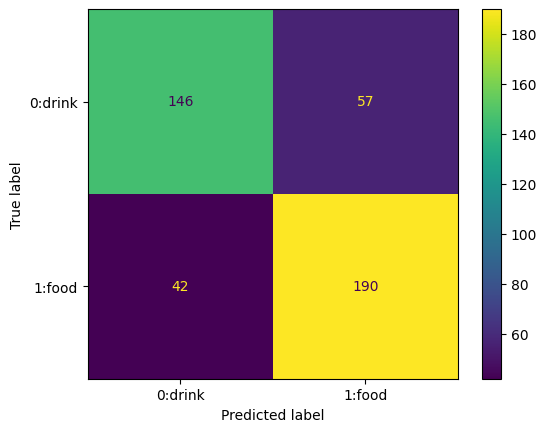

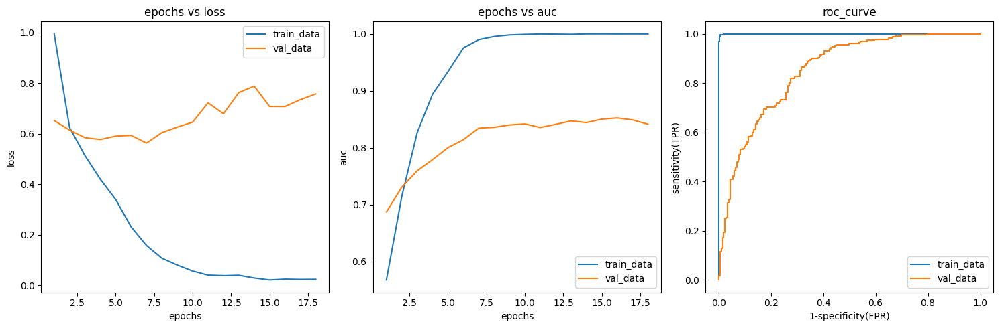

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


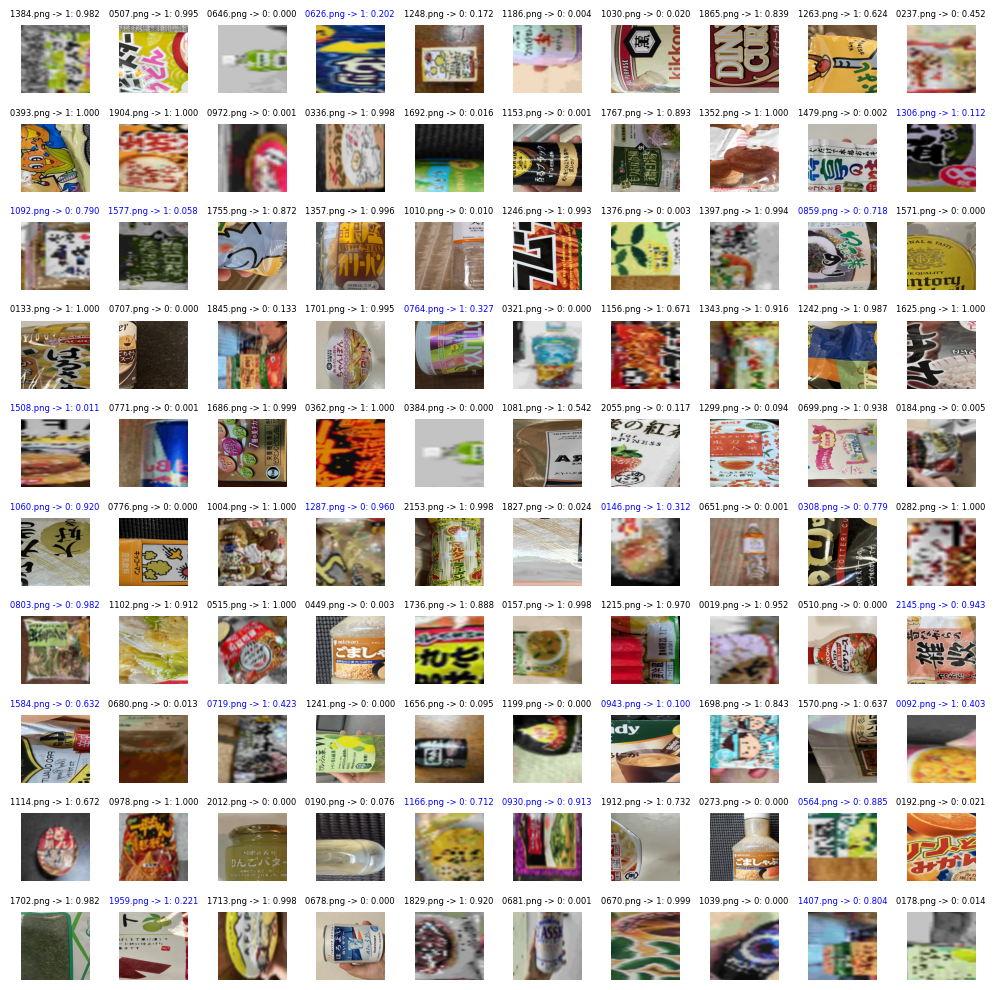

========================== 3fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.08048 auc: 0.56540 val_loss: 0.63051, val_auc: 0.72241


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.61630 auc: 0.72791 val_loss: 0.60023, val_auc: 0.75834


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.51342 auc: 0.82766 val_loss: 0.56647, val_auc: 0.77751


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.40859 auc: 0.90077 val_loss: 0.56038, val_auc: 0.79293


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.31886 auc: 0.94400 val_loss: 0.53324, val_auc: 0.81851


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.21963 auc: 0.97840 val_loss: 0.57506, val_auc: 0.82797


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.14626 auc: 0.99148 val_loss: 0.58412, val_auc: 0.82790


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.10185 auc: 0.99637 val_loss: 0.58597, val_auc: 0.83764


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.07397 auc: 0.99795 val_loss: 0.65520, val_auc: 0.82735


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.06244 auc: 0.99845 val_loss: 0.65559, val_auc: 0.83497


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.03531 auc: 0.99987 val_loss: 0.64885, val_auc: 0.84663


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.03361 auc: 0.99969 val_loss: 0.68069, val_auc: 0.84252


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.03072 auc: 0.99980 val_loss: 0.70726, val_auc: 0.84072


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


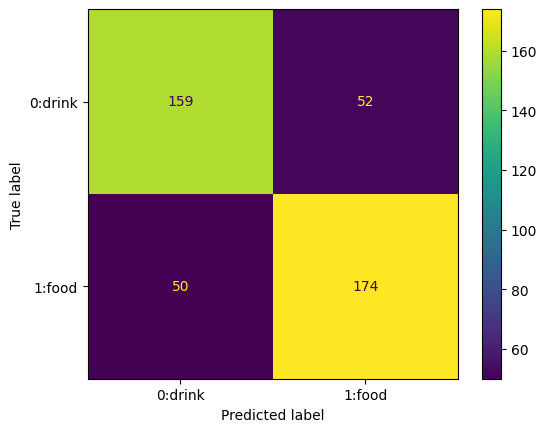

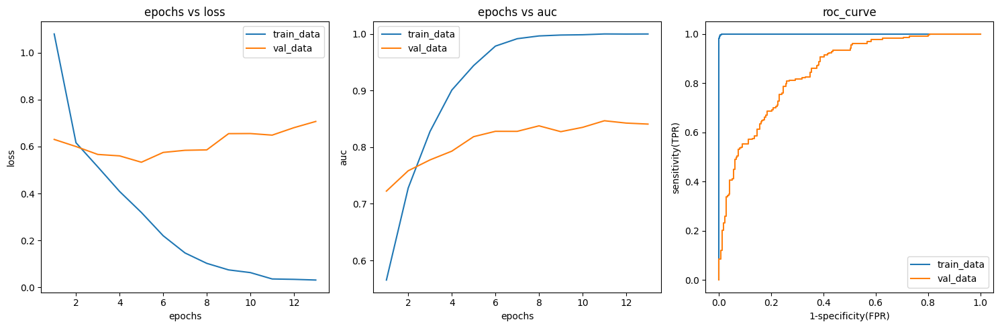

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


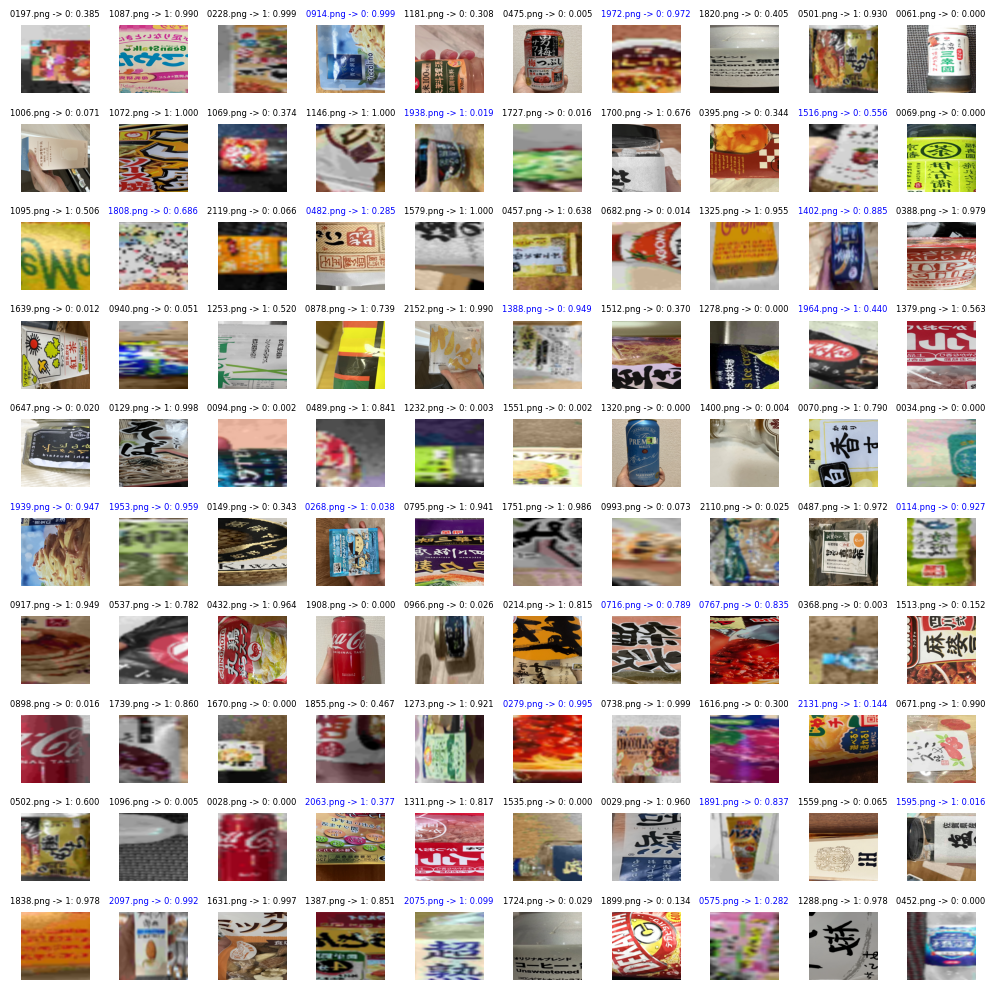

========================== 4fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.17348 auc: 0.53053 val_loss: 0.65440, val_auc: 0.70165


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.64458 auc: 0.69077 val_loss: 0.61406, val_auc: 0.73656


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.55347 auc: 0.79218 val_loss: 0.58644, val_auc: 0.77196


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.43858 auc: 0.88375 val_loss: 0.57649, val_auc: 0.77968


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.35542 auc: 0.92858 val_loss: 0.55564, val_auc: 0.80855


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.25443 auc: 0.96783 val_loss: 0.55881, val_auc: 0.82404


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.18121 auc: 0.98525 val_loss: 0.63960, val_auc: 0.82804


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.11926 auc: 0.99455 val_loss: 0.62524, val_auc: 0.83494


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.07397 auc: 0.99842 val_loss: 0.69863, val_auc: 0.83458


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.05191 auc: 0.99942 val_loss: 0.66026, val_auc: 0.84985


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.05136 auc: 0.99908 val_loss: 0.71656, val_auc: 0.84771


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.04281 auc: 0.99934 val_loss: 0.71342, val_auc: 0.84802


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


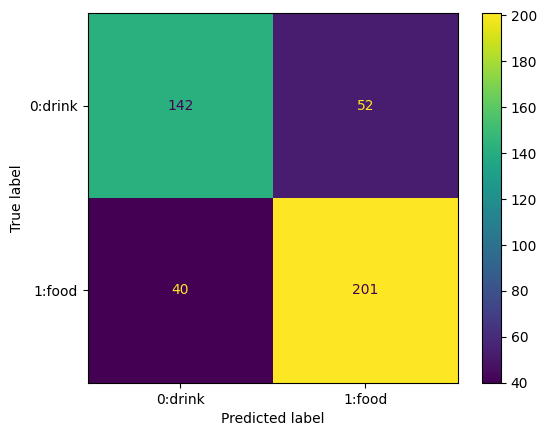

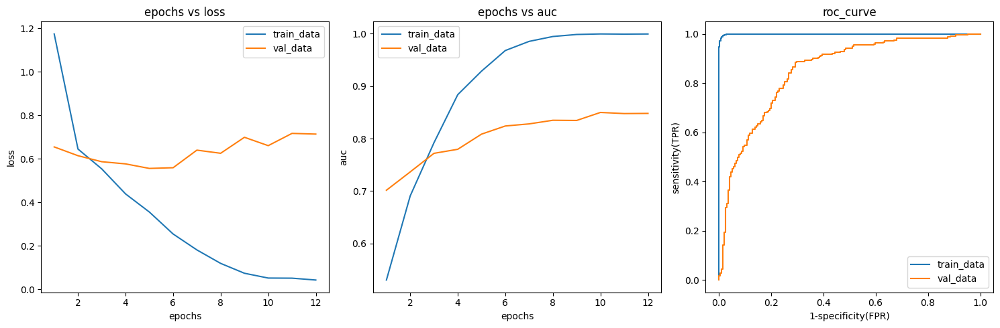

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


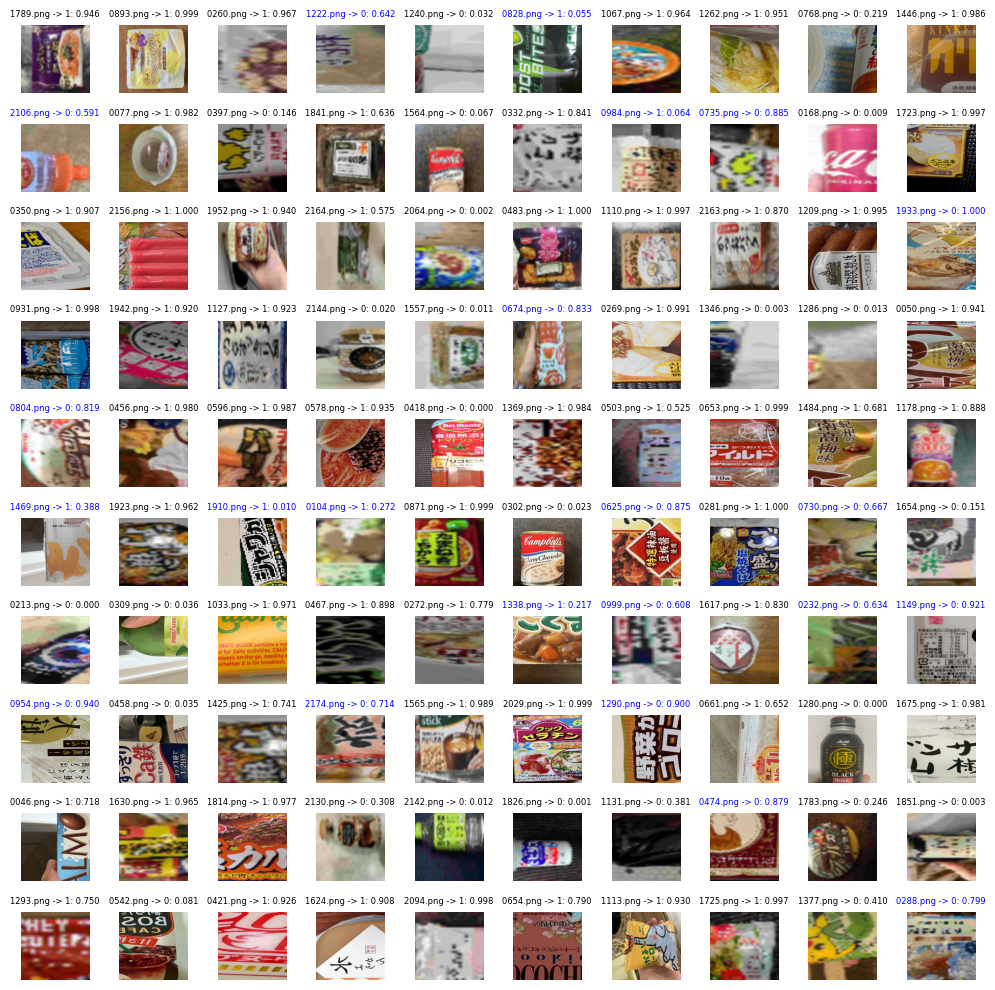

========================== 5fold ==========================


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [1/100], loss: 1.12428 auc: 0.55203 val_loss: 0.65144, val_auc: 0.70687


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.62747 auc: 0.70979 val_loss: 0.59427, val_auc: 0.75813


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.51894 auc: 0.82216 val_loss: 0.56540, val_auc: 0.79291


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.42374 auc: 0.89012 val_loss: 0.61197, val_auc: 0.80141


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.32238 auc: 0.94344 val_loss: 0.54815, val_auc: 0.82409


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.21131 auc: 0.97985 val_loss: 0.57735, val_auc: 0.82049


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.14845 auc: 0.99206 val_loss: 0.54780, val_auc: 0.84330


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.09775 auc: 0.99627 val_loss: 0.55614, val_auc: 0.85098


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.07468 auc: 0.99826 val_loss: 0.59598, val_auc: 0.84604


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.05629 auc: 0.99894 val_loss: 0.61803, val_auc: 0.85139


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.04120 auc: 0.99947 val_loss: 0.61094, val_auc: 0.86055


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.03985 auc: 0.99941 val_loss: 0.61656, val_auc: 0.86439


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.03370 auc: 0.99958 val_loss: 0.63769, val_auc: 0.85982


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.02612 auc: 0.99984 val_loss: 0.63764, val_auc: 0.86572


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.03468 auc: 0.99922 val_loss: 0.71841, val_auc: 0.85727


  0%|          | 0/55 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.02629 auc: 0.99979 val_loss: 0.67237, val_auc: 0.85958


  0%|          | 0/55 [00:00<?, ?it/s]

Early stopping


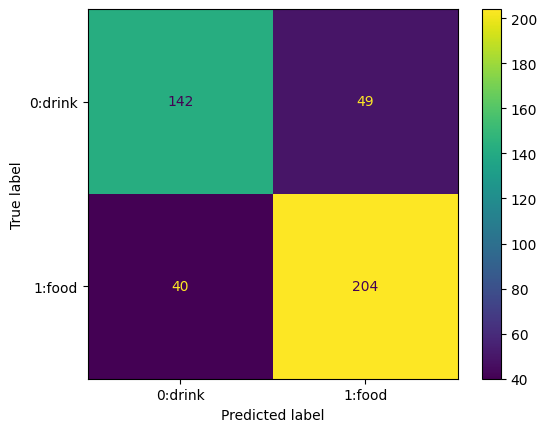

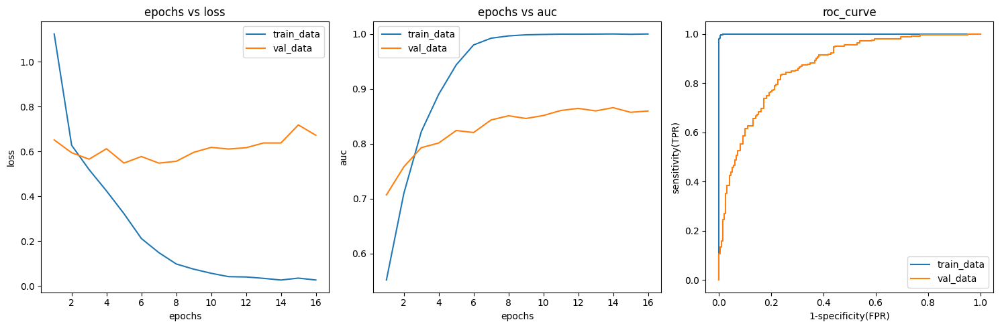

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


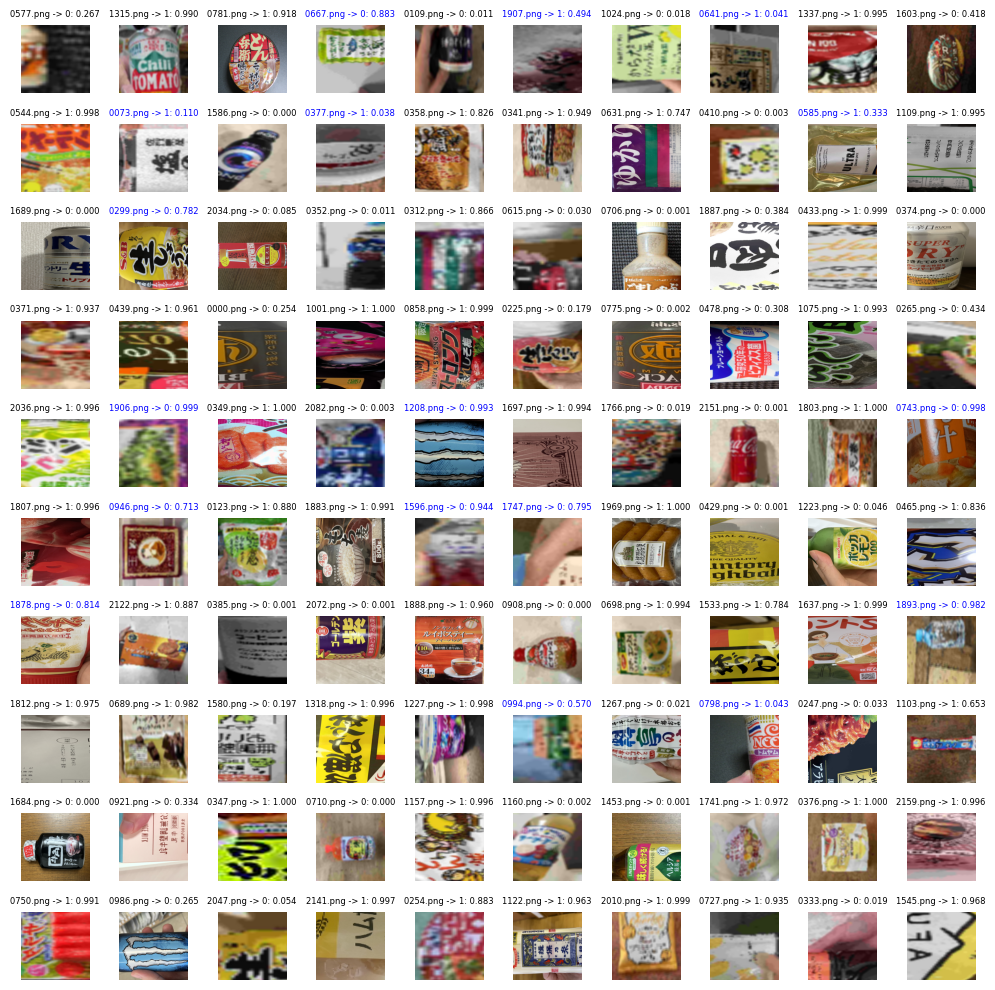

In [11]:
# 乱数初期化
torch_seed()

# バッチサイズ
train_batch_size = 32
test_batch_size = 128

# エポック数
num_epochs = 100

# データローダーのためのカスタムデータセットクラス
class ImageFolderWithPaths(datasets.ImageFolder):

  # 指定されたインデックスのデータアイテムを返すメソッド
  def __getitem__(self, index):
    # 通常のImageFolderの出力(画像データとラベル)を取得
    original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
    # ファイルパスを取得
    path = self.imgs[index][0]
    # 元のタプルにパスを追加
    tuple_with_path = original_tuple + (path,)
    return tuple_with_path

# データセットをロード
train_dataset = ImageFolderWithPaths(train_dir, transform=train_transform)
val_dataset = ImageFolderWithPaths(train_dir, transform=test_transform)

# 5Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
for fold, (trn_idx, val_idx) in enumerate(cv.split(train_df['image_name'], train_df['label'])):

  print(f'========================== {fold+1}fold ==========================')
  # この中にログを保存
  history = np.zeros([0, 5])
  # 関数の呼び出し
  net = create_new_network()
  criterion, optimizer = create_new_optimizer(net)

  # インデックスに対応したデータのみ抽出
  train_data = Subset(train_dataset, trn_idx)
  val_data = Subset(val_dataset, val_idx)

  # データローダー定義（訓練用）
  train_loader = DataLoader(train_data, batch_size=train_batch_size, shuffle=True)
  # データローダー定義（検証用）
  val_loader = DataLoader(val_data, batch_size=test_batch_size, shuffle=False)
  # モデルの学習
  history, result_df, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm = fit(net, criterion, optimizer, num_epochs, train_loader, val_loader, device, history, base_dir, fold)
  # 学習曲線を描画
  learning_curve_and_confusion_matrix(history, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm)
  # 検証データの画像と予測結果の出力
  print('閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)')
  show_images_labels(val_loader, result_df)